In [1]:
import re
import csv
import pandas as pd
import numpy as np
import pickle
import time
import string
import os
os.chdir(r"C:\Users\dogus\Dropbox\DgsPy_DBOX\Amazon Project")

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import matplotlib.pyplot as plt
%matplotlib inline

from nltk.corpus import stopwords
from contextlib import contextmanager
import eli5

import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import ShuffleSplit, learning_curve
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold

from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import f1_score, log_loss,roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_log_error

from sklearn.feature_extraction.text import TfidfTransformer, TfidfVectorizer, CountVectorizer
from sklearn.ensemble import RandomForestClassifier

In [3]:
def combine_CSVs_infolder():
    os.chdir(r"C:\Users\dogus\Dropbox\DgsPy_DBOX\Amazon Project\comments_AMAZON")
    filenames = os.listdir()
    comb = pd.concat( [pd.read_csv(f) for f in filenames])
    comb.to_csv('AMAZON_comments_yuge.csv', index=False)

def clean_str(text):
    try:
        text = ' '.join( [w for w in text.split()] )        
        text = text.lower()
        text = re.sub(u"é", u"e", text)
        text = re.sub(u"ē", u"e", text)
        text = re.sub(u"è", u"e", text)
        text = re.sub(u"ê", u"e", text)
        text = re.sub(u"à", u"a", text)
        text = re.sub(u"â", u"a", text)
        text = re.sub(u"ô", u"o", text)
        text = re.sub(u"ō", u"o", text)
        text = re.sub(u"ü", u"u", text)
        text = re.sub(u"ï", u"i", text)
        text = re.sub(u"ç", u"c", text)
        text = re.sub(u"\u2019", u"'", text)
        text = re.sub(u"\xed", u"i", text)
        text = re.sub(u"w\/", u" with ", text)
        
        text = re.sub(u"[^a-z0-9]", " ", text)  # delete unnecessary characters
        text = u" ".join(re.split('(\d+)',text) )
        text = re.sub( u"\s+", u" ", text ).strip()
        text = ''.join(text)
    except:
        text = np.NaN
    return text

def clean_int2(text):
    import re
    output = re.sub(r'\d+', '', str(text))
    return output

def sorttext(x):
    iscolor = x[3][:5]=='Color'
    isprovider = x[3][:17]=='Service Provider:'
    issize = x[3][:5]=='Size:'
    isstyle = x[3][:6]=='Style:'
    
    if iscolor | isprovider | issize:
        if 'helpful' in x[-3]:
            x = " ".join(x[4:-3])
        else:
            x = " ".join(x[4:-2])
    else:
        if 'helpful' in x[-3]:
            x = " ".join(x[4:-3])
        else:
            x = " ".join(x[4:-2])
    return x

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.subplots(figsize=(12,6))
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    plt.savefig('learningcurves.png')
    return plt

def model_eval(model, k=5, seed=0):
    kfold = StratifiedKFold(k, random_state=seed)
    
    oof = np.zeros(len(y))
    for nfold, (train_ix, valid_ix) in enumerate(kfold.split(X,y)):
        trainX, validX = X[train_ix], X[valid_ix]
        trainy, validy = y[train_ix], y[valid_ix]

        model.fit(trainX, trainy)
        p = model.predict(validX)
        oof[valid_ix] = p
        
        print('Fold{}, Valid AUC: {:.4f}'.format(nfold,roc_auc_score(validy, p)))
        
    print(confusion_matrix(y, oof))
    print(classification_report(y, oof))
    print('Valid RMSLE: {:.3f}'.format(np.sqrt(mean_squared_log_error(y, oof))))
    print("F1_score : {:.2%} ".format(f1_score(y, oof, average='micro')))  # 'samples', 'weighted', 'macro', 'micro', 'binary'
    print('AUC: {:.4f}'.format(roc_auc_score(y, oof)))
    
    return model, oof

In [4]:
data = pd.read_csv('AMAZON_comments_yuge.csv')
data = data.drop_duplicates(subset='Text', keep=False)
data.reset_index(inplace=True,drop=True)
df = data.copy()
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 199672 entries, 0 to 199671
Data columns (total 3 columns):
Text           199672 non-null object
Phone Title    199672 non-null object
Stars          199672 non-null int64
dtypes: int64(1), object(2)
memory usage: 4.6+ MB
None


In [5]:
df['Text'][85101]

'Kenneth B.\r\r\nFive Stars\r\r\nJune 5, 2016\r\r\nStyle: U.S. Version (LGUS991)Verified Purchase\r\r\nNice phone\r\r\nHelpful\r\r\nComment Report abuse'

In [6]:
df['Text'][85101].split('\r\r\n')

['Kenneth B.',
 'Five Stars',
 'June 5, 2016',
 'Style: U.S. Version (LGUS991)Verified Purchase',
 'Nice phone',
 'Helpful',
 'Comment Report abuse']

In [7]:
%%time
df['Text'] = df['Text'].apply(clean_int2)  # Clean any integer value
df['Text'] = df['Text'].apply(lambda x: x.split('\r\r\n'))  # Seperate text into parts
df['Name'] = df['Text'].apply(lambda x: x[0])  # Name of the commentator
df['Title'] = df['Text'].apply(lambda x: x[1])
df['Text'] = df['Text'].apply(sorttext)

Wall time: 2.32 s


In [8]:
# Titles contain the summary information of customer reviews, titles should be added into Text column but they contain Target info.
df['Title'] = df['Title'].apply(lambda x: "" if ('Star' in x.split())|('Stars' in x.split()) else x)
df['Title']

0                                                     Nice!
1                   I Bought It Today ( February th,  ) ...
2                                         Bad phone. False.
3                                               as expected
4                                      Terrible experience!
5                                      I am very impressed.
6                                                      Wow!
7         Both phones were in perfect conditions. They a...
8                         Stop and rethink before purchase!
9                                           This is Great!!
10                                       Absolutely Amazing
11                                        / would recommend
12                                        I’m disappointed.
13        And to be honest it looked like they sent the ...
14                                   Great I phone purchase
15                    % working... important feature broken
16                              Re: Exce

In [9]:
# Gather all of the phone model names from the data
modellist = list(set(df['Phone Title'].values))
modellist = list(map(lambda model: ''.join([e for e in model if e not in set(string.punctuation)]),modellist))
brands = []
models_1 = []
models_2 = []
for model in modellist:
    if len(model.split())>3:
        brand = model.split()[0]
        brands.append(brand)

        m = model.split()[1]
        models_1.append(m)

        m = model.split()[2]
        models_2.append(m)
    else:pass
models_1 = set(map(lambda x: x.lower().strip(),set(models_1)))
models_2 = set(map(lambda x: x.lower().strip(),set(models_2)))
# Merge the two models set, because they contain some duplicate names.
models = list(models_1.union(models_2))
brands = list(map(lambda x: x.lower().strip(),set(brands)))

In [10]:
t0 = time.time()
print("Preprocessing Comments..","\n")

if df['Title'].isna().sum()!=0:
    print("NaNs in Title: ",df['Title'].isna().sum())
    df['Title'] = df['Title'].apply(lambda x: "" if isinstance(x,float) else x)

if df.isna().sum().sum()!=0:
    print("NANs in DF:\n",df.isna().sum())
    df.dropna(axis=0,inplace=True)

# Merge Comments and Titles
df['Text'] = df['Text']+' '+df['Title']
df = df[['Text','Stars']]

# Delete Unnecessary Text
df['Text'] = df['Text'].apply(lambda x: x.replace('Verified Purchase',""))

# Make everything lowercase for the simplicity.
df['Text'] = df['Text'].apply(lambda x: x.lower())

print(df['Text'][0],"\n")
print('Deleting model informations')
df['Text'] = df['Text'].apply(lambda text: ' '.join([word for word in text.split() if word not in models]))

print('Deleting brand names...')
df['Text'] = df['Text'].apply(lambda text: ' '.join([word for word in text.split() if word not in brands]))

print("Adjusting characters, skipping symbols, trimming escape characters.\n")
df['Text'] = df['Text'].apply(clean_str)
print(df['Text'][0],"\n")

print('Deleting stopwords...')
df['Text'] = df['Text'].apply(lambda text: ' '.join([word for word in text.split() if word not in set(stopwords.words('english'))]))

print('Deleting punctuations...')
df['Text'] = df['Text'].apply(lambda ftext: ''.join([e for e in ftext if e not in set(string.punctuation)]))

# Merge Comments and Titles
df['Text'] = df['Text'].apply(lambda x: x.replace('amazon',""))
df['Text'] = df['Text'].apply(lambda x: x.replace('verizon',""))

print(df['Text'][0],"\n")
print("Completed within %0.1f minutes." % ((time.time() - t0)/60)) # 13.7


Preprocessing Comments.. 

really really good! it's like a new phone, no one scratches, i'm really happy with it, just the charger is not original but i don't care, it's good enough nice! 

Deleting model informations
Deleting brand names...
Adjusting characters, skipping symbols, trimming escape characters.

really really good it s like a phone scratches i m really happy it just the charger is not but i don t care it s good enough nice 

Deleting stopwords...
Deleting punctuations...
really really good like phone scratches really happy charger care good enough nice 

Completed within 30.3 minutes.


# Outliers

In [11]:
# Measure Text Lengths
df['textlength'] = df['Text'].apply(lambda x: len(x))
df['textlength'].describe()

count    199672.000000
mean        142.266988
std         316.727687
min           0.000000
25%          23.000000
50%          66.000000
75%         144.000000
max       16055.000000
Name: textlength, dtype: float64

In [23]:
# Plot the length of every comment, and discard outliers
trace = go.Scattergl(
    x = df['textlength'].index,
    y = df['textlength'].values,
    mode='markers',
    marker=dict(opacity=0.1)
)
data = [trace]
py.iplot(data, filename='Text Length')

In [13]:
df['textbool'] = df['textlength'].apply(lambda x: 1 if x<500 else 0)
df = df[df['textbool']==1]

# Target Distribution

In [14]:
starsfq = df['Stars'].value_counts()
df['Stars'].value_counts()

5    100008
1     40220
4     25010
3     13296
2     11452
Name: Stars, dtype: int64

In [15]:
trace = go.Bar(
    x=starsfq.index,
    y=starsfq.values,
    marker=dict(
        color=starsfq.values
        ),
    )

layout = go.Layout(
    title='Star Counts',
    )

data = [trace]
fig = go.Figure(
    data=data,
    layout=layout
    )
py.iplot(fig, filename='StarCounts')

# Wordcloud

In [17]:
tt = []
for text in df['Text'].sample(frac=1.0)[:10000]:
    tt.append(text)
TEXT = " ".join(tt)

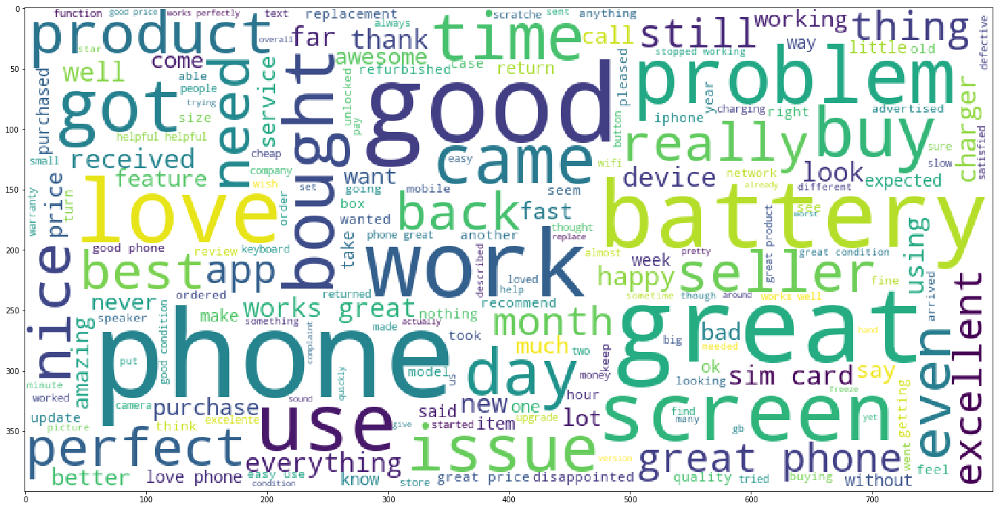

In [21]:
from wordcloud import WordCloud, STOPWORDS

wordcloud = WordCloud(
    background_color='white',
    stopwords=STOPWORDS,
    max_words=200,
    max_font_size=100,
    random_state=11,
    width=800,
    height=400,
    )
wordcloud.generate(TEXT)

plt.figure(figsize=(24,12))
plt.imshow(wordcloud)

# Word Frequency Plots

In [19]:
from collections import defaultdict
from plotly import tools

df5 = df.loc[df["Stars"]==5,'Text']
df4 = df.loc[df["Stars"]==4,'Text']
df3 = df.loc[df["Stars"]==3,'Text']
df2 = df.loc[df["Stars"]==2,'Text']
df1 = df.loc[df["Stars"]==1,'Text']

## custom function for ngram generation ##
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(" ") if token != "" if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [" ".join(ngram) for ngram in ngrams]

## custom function for horizontal bar chart ##
def horizontal_bar_chart(df, color):
    trace = go.Bar(
        y=df["word"].values[::-1],
        x=df["wordcount"].values[::-1],
        showlegend=False,
        orientation = 'h',
        marker=dict(
            color=color,
        ),
    )
    return trace

## 5 Starred Texts ##
freq_dict = defaultdict(int)
for sent in df5:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(50), 'green')

## 3 Starred Texts ##
freq_dict = defaultdict(int)
for sent in df3:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(50), 'blue')

## 1 Starred Texts ##
freq_dict = defaultdict(int)
for sent in df1:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(50), 'orange')

# Creating two subplots
fig = tools.make_subplots(rows=1, cols=3, vertical_spacing=0.04,
                          subplot_titles=["5 Starred: Word Frequency",
                                          "3 Starred: Word Frequency", 
                                          "1 Starred: Word Frequency"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 2)
fig.append_trace(trace2, 1, 3)
fig['layout'].update(height=1200, width=900, paper_bgcolor='rgb(233,233,233)', title="Word Count Plots")
py.iplot(fig, filename='word-plots')

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]  [ (1,3) x3,y3 ]



In [20]:
freq_dict = defaultdict(int)
for sent in df5:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(50), 'orange')


freq_dict = defaultdict(int)
for sent in df1:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(50), 'orange')

# Creating two subplots
fig = tools.make_subplots(rows=1, cols=2, vertical_spacing=0.04,horizontal_spacing=0.15,
                          subplot_titles=["5 Starred: Word Bigram Frequency", 
                                          "1 Starred: Word Bigram Frequency"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 2)
fig['layout'].update(height=1200, width=900, paper_bgcolor='rgb(233,233,233)', title="Bigram Count Plots")
py.iplot(fig, filename='word-plots')

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



In [24]:
df[['Text','Stars']].to_csv('cleaned_amazon_yuge.csv',index=False)

# Algorithm Training

### Target Feature: Satisfaction 
Since the data I mined doesn't contain enough sample to train algorithms to predict 2,3,4 starred comments, I decided to seperate the data into two segments, positive and negative comments, by naming 5 and 4 starred comments "1" and 1 and 2 starred comments "0".

In [26]:
df['Stars'] = df['Stars'].astype(float)
# Negative, Positive, Neutr Comments
df['Satisfaction'] = df['Stars'].apply(lambda x: 0 if x<=2 else (1 if x>=4 else 2))
df = df[df['Satisfaction']!=2]
len(df[df['Satisfaction']==0]),len(df[df['Satisfaction']==1])
df.reset_index(drop=True, inplace=True)

## Vectorization

### TfidfVectorizer

In [27]:
text = df['Text']
tfidf = TfidfVectorizer(token_pattern=r'\w{2,}',
                        ngram_range=(1, 3),
                        max_df=0.5,
                        #encoding='utf-8',
                        #decode_error='ignore',
                        #strip_accents='unicode'
                       )

tfidf.fit(text)
trans_tfidf = tfidf.transform(text)
#trans_tfidf = tfidf_fitted.transform(feature_test)

from sklearn.model_selection import train_test_split
X = trans_tfidf
y = df['Satisfaction'].astype(float)

feature_train, feature_test, label_train, label_test = train_test_split(X, y, test_size=0.3, shuffle=True)

## Model Building

### LogisticRegression

In [28]:
logr = LogisticRegression()
logr, logr_preds = model_eval(logr)

Fold0, Valid AUC: 0.9176
Fold1, Valid AUC: 0.8852
Fold2, Valid AUC: 0.8683
Fold3, Valid AUC: 0.8976
Fold4, Valid AUC: 0.8917
[[ 42680   8992]
 [  5226 119792]]
              precision    recall  f1-score   support

         0.0       0.89      0.83      0.86     51672
         1.0       0.93      0.96      0.94    125018

   micro avg       0.92      0.92      0.92    176690
   macro avg       0.91      0.89      0.90    176690
weighted avg       0.92      0.92      0.92    176690

Valid RMSLE: 0.197
F1_score : 91.95% 
AUC: 0.8921


<module 'matplotlib.pyplot' from 'c:\\users\\dogus\\appdata\\local\\programs\\python\\python36\\lib\\site-packages\\matplotlib\\pyplot.py'>

<Figure size 432x288 with 0 Axes>

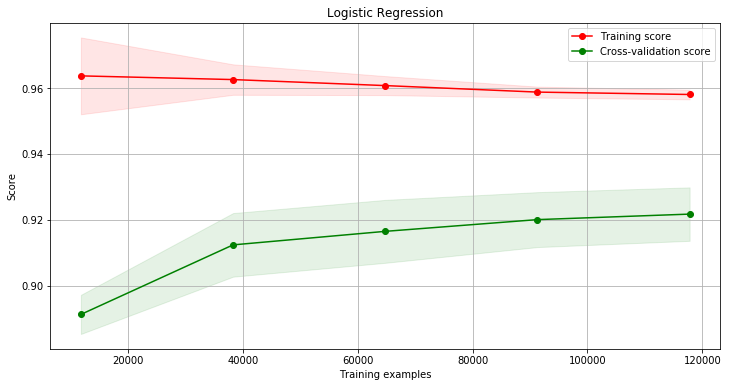

In [29]:
plot_learning_curve(logr,'Logistic Regression', X=X, y=y, n_jobs=4)

### Stochastic Gradient Descent

In [30]:
model = SGDClassifier(loss='modified_huber')
sgd, sgd_preds = model_eval(model)

Fold0, Valid AUC: 0.9173
Fold1, Valid AUC: 0.8821
Fold2, Valid AUC: 0.8668
Fold3, Valid AUC: 0.8969
Fold4, Valid AUC: 0.8891
[[ 42512   9160]
 [  5231 119787]]
              precision    recall  f1-score   support

         0.0       0.89      0.82      0.86     51672
         1.0       0.93      0.96      0.94    125018

   micro avg       0.92      0.92      0.92    176690
   macro avg       0.91      0.89      0.90    176690
weighted avg       0.92      0.92      0.92    176690

Valid RMSLE: 0.198
F1_score : 91.86% 
AUC: 0.8904


<module 'matplotlib.pyplot' from 'c:\\users\\dogus\\appdata\\local\\programs\\python\\python36\\lib\\site-packages\\matplotlib\\pyplot.py'>

<Figure size 432x288 with 0 Axes>

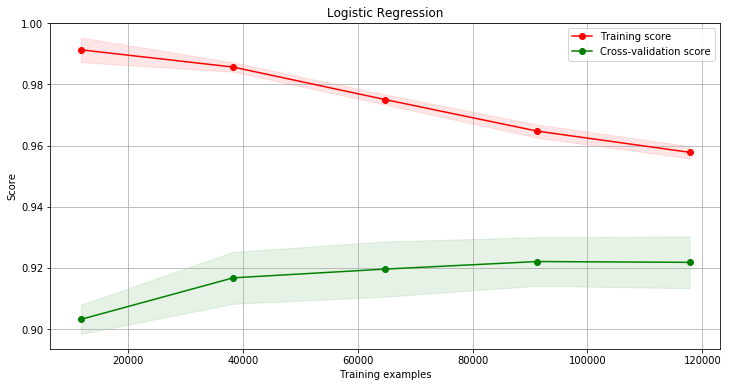

In [31]:
plot_learning_curve(sgd,'Logistic Regression', X=X, y=y, n_jobs=4)

In [32]:
eli5.show_weights(sgd, vec=tfidf, top=40)

Weight?,Feature
+5.979,great
+5.243,love
+4.058,perfect
+3.760,excellent
+3.378,best
+3.126,awesome
+3.114,far
+2.885,amazing
+2.785,easy
+2.748,nice


### RandomForestClassifier

In [33]:
%%time
tree = RandomForestClassifier(verbose=1, n_jobs=-1)
tree , tree_preds = model_eval(tree,k=2)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:  9.2min finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    1.4s finished


Fold0, Valid AUC: 0.8417


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed: 10.0min finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    1.4s finished


Fold1, Valid AUC: 0.8536
[[ 38910  12762]
 [  7222 117796]]
              precision    recall  f1-score   support

         0.0       0.84      0.75      0.80     51672
         1.0       0.90      0.94      0.92    125018

   micro avg       0.89      0.89      0.89    176690
   macro avg       0.87      0.85      0.86    176690
weighted avg       0.89      0.89      0.88    176690

Valid RMSLE: 0.233
F1_score : 88.69% 
AUC: 0.8476
Wall time: 19min 14s


In [34]:
std = np.std([ree.feature_importances_ for ree in tree.estimators_], axis=0).astype(np.float32)
imps = pd.DataFrame({
    'Features':tfidf.get_feature_names(),
    'Importances':tree.feature_importances_.astype(np.float32),
    'Stds':std
    }
            ).sort_values(by='Importances', ascending=False).reset_index(drop=True)
imps.to_csv('important_features.csv',index=False)

In [35]:
trace = go.Bar(x=imps.Features[:20],
                y=imps.Importances[:20],
                marker=dict(color='red'),
                error_y = dict(visible=True, arrayminus=imps.Stds[:20]),
                opacity=0.5
               )
layout = go.Layout(title="RandomForest Feature Importances")
fig = go.Figure(data=[trace], layout=layout)
py.iplot(fig)

### Lightgbm

In [38]:
import lightgbm as lgb
from lightgbm import LGBMClassifier

model = LGBMClassifier()
lgb_model, lgb_preds = model_eval(model)

Fold0, Valid AUC: 0.8959
Fold1, Valid AUC: 0.8629
Fold2, Valid AUC: 0.8474
Fold3, Valid AUC: 0.8698
Fold4, Valid AUC: 0.8636
[[ 40526  11146]
 [  6054 118964]]
              precision    recall  f1-score   support

         0.0       0.87      0.78      0.82     51672
         1.0       0.91      0.95      0.93    125018

   micro avg       0.90      0.90      0.90    176690
   macro avg       0.89      0.87      0.88    176690
weighted avg       0.90      0.90      0.90    176690

Valid RMSLE: 0.216
F1_score : 90.27% 
AUC: 0.8679


In [40]:
eli5.show_weights(lgb_model, vec=tfidf, top=50)

Weight,Feature
0.1314,great
0.0680,love
0.0623,good
0.0450,excellent
0.0388,work
0.0372,perfect
0.0244,return
0.0192,best
0.0188,nice
0.0176,works


## Blending

In [41]:
# Simple Averaging
blend = (logr_preds + sgd_preds + tree_preds + lgb_preds)/4

print('Valid RMSLE: {:.4f}'.format(np.sqrt(mean_squared_log_error(y, blend))))
print('AUC: {:.4f}'.format(roc_auc_score(y, blend)))

Valid RMSLE: 0.1860
AUC: 0.9222


In [ ]:
# Voting Classifier
from sklearn.ensemble import VotingClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

blender = VotingClassifier(estimators=[('logr',logr),
                                     ('SGD',sgd),
                                     ('tree',tree),
                                     ('lgb',lgb_model)],
                         voting='hard'                         
                        )

blender, blend_preds = model_eval(blender)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed: 16.6min finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    0.6s finished


Fold0, Valid AUC: 0.9202


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


## Stacking

In [ ]:
stacked_df = pd.DataFrame({
    'logr_preds':logr_preds,
    'sgd_preds':sgd_preds,
    'tree_preds':tree_preds,
    'lgb_preds':lgb_preds,
    'blend_preds':blend
})

In [ ]:
from xgboost import XGBClassifier

s_train, s_test, y_train, y_test = train_test_split(stacked_df, y, test_size=0.3, random_state=1)

xgb = XGBClassifier()
xgb.fit(s_train,y_train)
stack_pred = xgb.predict(s_test)

print(confusion_matrix(stack_pred, y_test))
print(classification_report(stack_pred, y_test))
print('Valid RMSLE: {:.3f}'.format(np.sqrt(mean_squared_log_error(stack_pred, y_test))))
print("F1_score : {:.2%} ".format(f1_score(stack_pred, y_test)))
print('ROC AUC: {:.4f}'.format(roc_auc_score(stack_pred, y_test))

In [ ]:
eli5.show_weights(xgb)